**Take Home Assignment**

**Alejandro Sanchez**


Used ClaudeAI for help constructing program

**MSBA 503**

# *METHOD 1* :

This code detects objects using the YOLO algorithm.

In [2]:
pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 898.8/898.8 kB 22.2 MB/s eta 0:00:00


In [3]:
from ultralytics import YOLO
from PIL import Image
import matplotlib.pyplot as plt

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [8]:
model = YOLO("yolov8m.pt")
results = model.predict("image1.jpg")
result = results[0]


image 1/1 /content/image1.jpg: 640x640 2 apples, 2 oranges, 1559.1ms
Speed: 5.7ms preprocess, 1559.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)



0: 640x640 2 apples, 1 orange, 379.6ms
Speed: 12.4ms preprocess, 379.6ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


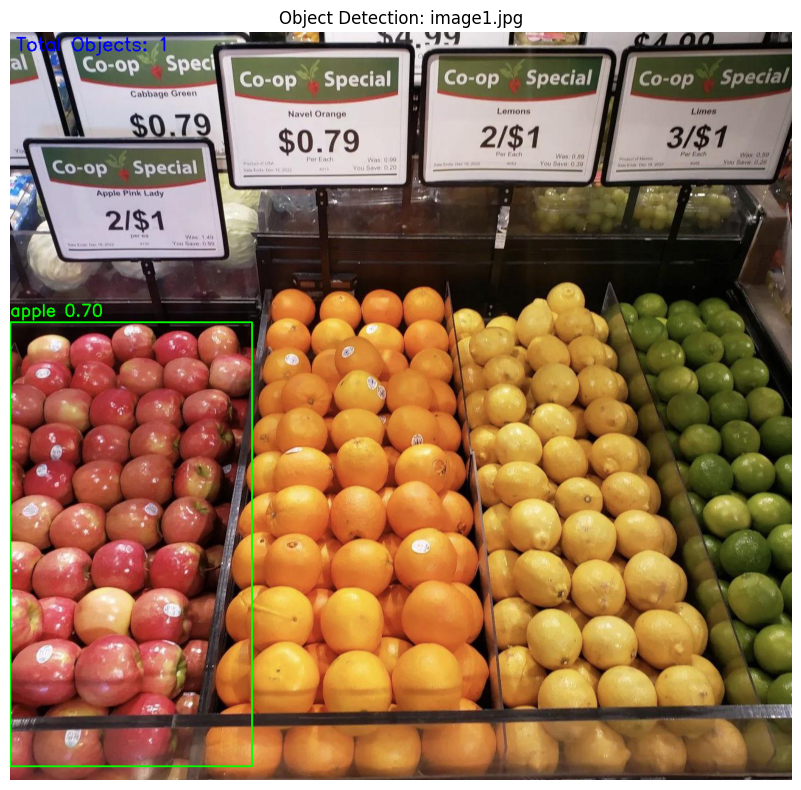


0: 640x640 2 couchs, 1 potted plant, 1 tv, 368.9ms
Speed: 4.4ms preprocess, 368.9ms inference, 5.4ms postprocess per image at shape (1, 3, 640, 640)


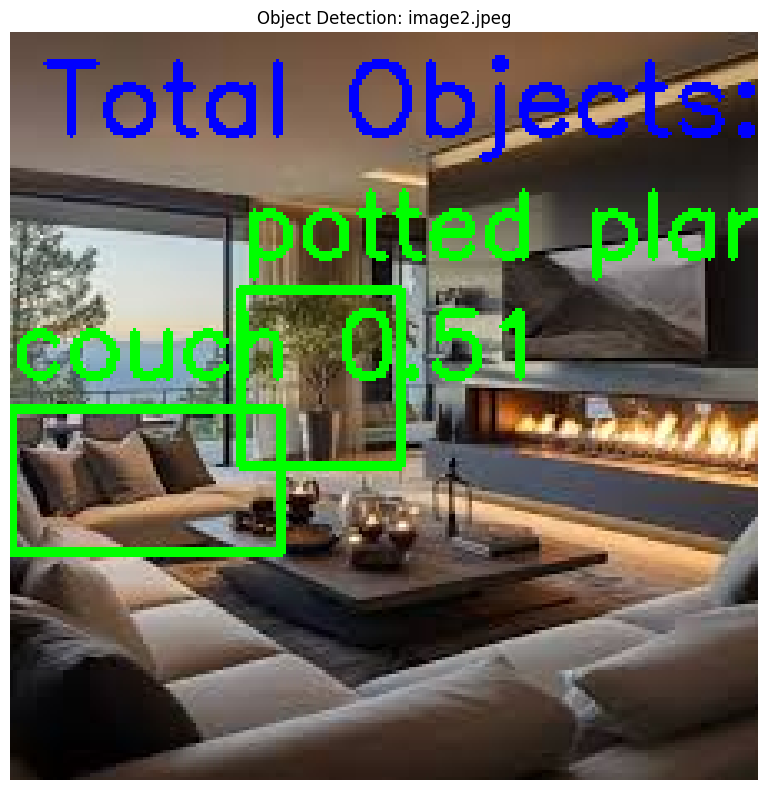


0: 640x480 1 bottle, 3 bowls, 3 oranges, 4 potted plants, 1 oven, 1 sink, 3 vases, 205.2ms
Speed: 4.3ms preprocess, 205.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


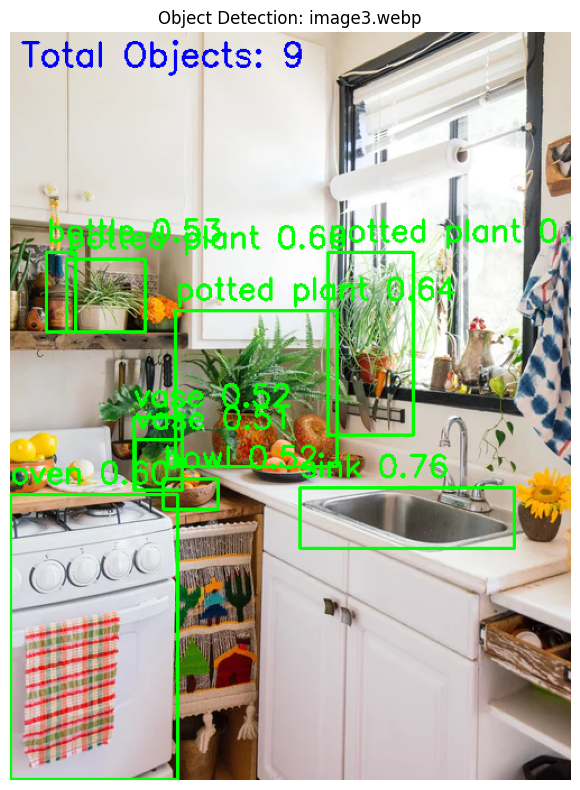


0: 352x640 4 persons, 1 frisbee, 219.6ms
Speed: 3.5ms preprocess, 219.6ms inference, 1.2ms postprocess per image at shape (1, 3, 352, 640)


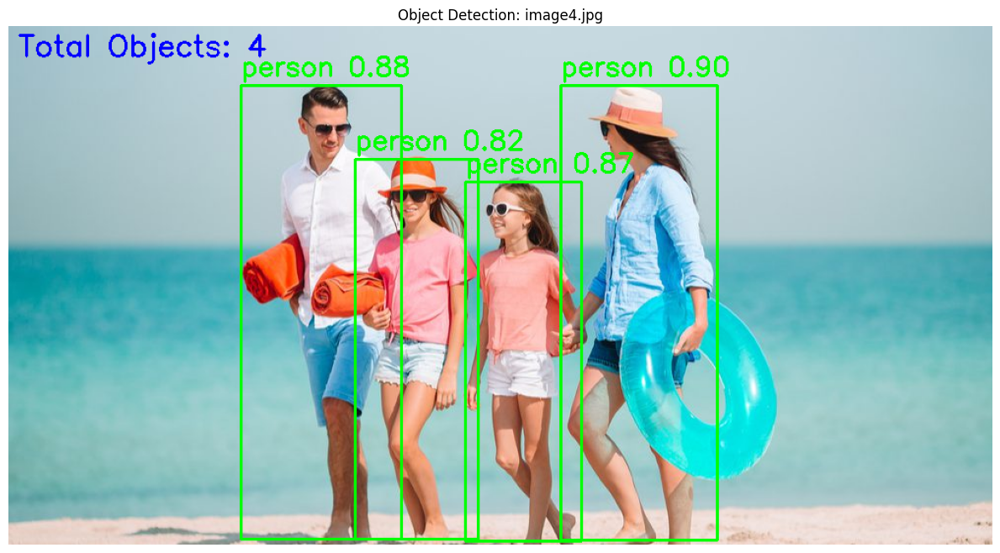


0: 448x640 5 birds, 1 horse, 7 sheeps, 1 cow, 264.9ms
Speed: 9.0ms preprocess, 264.9ms inference, 1.4ms postprocess per image at shape (1, 3, 448, 640)


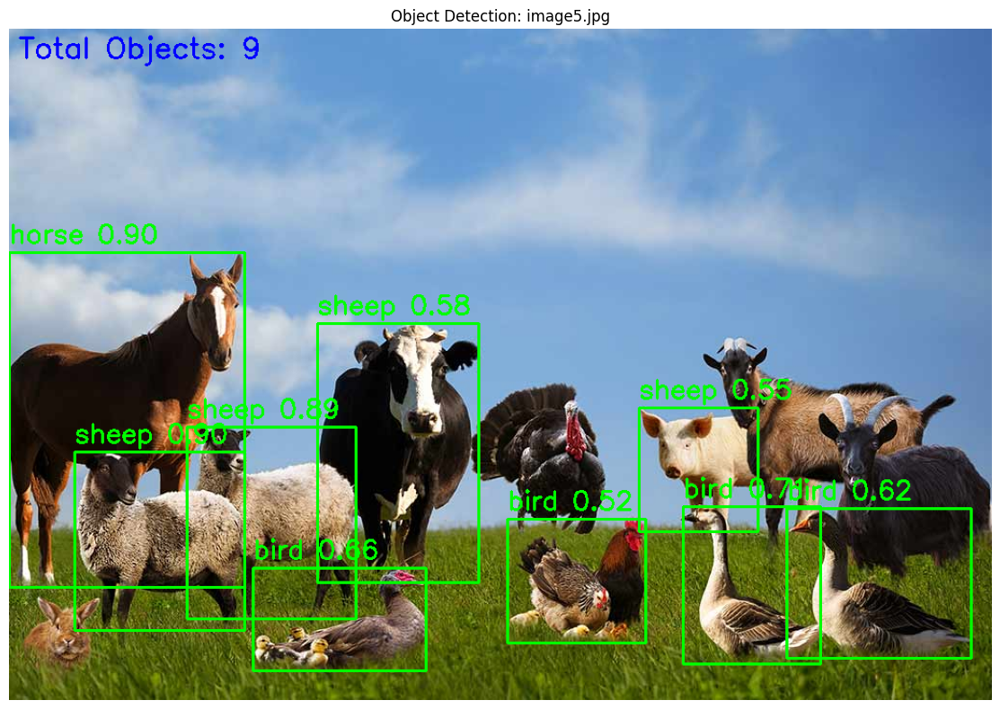


Detections for image1.jpg:
Total Objects: 1

Detection Details:
- apple (Confidence: 69.55%)

Detections for image2.jpeg:
Total Objects: 2

Detection Details:
- potted plant (Confidence: 64.12%)
- couch (Confidence: 50.56%)

Detections for image3.webp:
Total Objects: 9

Detection Details:
- sink (Confidence: 75.50%)
- potted plant (Confidence: 65.78%)
- potted plant (Confidence: 63.63%)
- oven (Confidence: 60.48%)
- bottle (Confidence: 53.17%)
- vase (Confidence: 52.05%)
- bowl (Confidence: 51.66%)
- potted plant (Confidence: 51.43%)
- vase (Confidence: 50.82%)

Detections for image4.jpg:
Total Objects: 4

Detection Details:
- person (Confidence: 90.19%)
- person (Confidence: 87.68%)
- person (Confidence: 87.30%)
- person (Confidence: 82.38%)

Detections for image5.jpg:
Total Objects: 9

Detection Details:
- sheep (Confidence: 89.95%)
- horse (Confidence: 89.68%)
- sheep (Confidence: 88.55%)
- bird (Confidence: 70.51%)
- bird (Confidence: 65.76%)
- bird (Confidence: 61.76%)
- sheep (C

In [10]:
import os
import cv2
import matplotlib.pyplot as plt
from ultralytics import YOLO
from collections import Counter

class BatchObjectDetector:
    def __init__(self, model_path='yolov8n.pt'):
        self.model = YOLO(model_path)

    def process_batch(self, image_paths, output_directory='detections', confidence_threshold=0.5, display_images=True):
        """
        Detect objects in a batch of images with optional display
        """
        os.makedirs(output_directory, exist_ok=True)
        batch_results = {}

        for image_path in image_paths:
            image = cv2.imread(image_path)
            if image is None:
                print(f"Error: Could not read image from {image_path}. Skipping...")
                continue

            filename = os.path.basename(image_path)
            results = self.model(image)[0]

            detections = []
            object_counts = Counter()

            for result in results.boxes:
                x1, y1, x2, y2 = result.xyxy[0].tolist()
                conf = result.conf[0]
                cls = int(result.cls[0])
                class_name = self.model.names[cls]

                if conf >= confidence_threshold:
                    detection_info = {
                        'class': class_name,
                        'confidence': float(conf),
                        'bbox': [x1, y1, x2, y2]
                    }
                    detections.append(detection_info)
                    object_counts[class_name] += 1

            # Annotate image
            annotated_image = image.copy()
            for detection in detections:
                x1, y1, x2, y2 = map(int, detection['bbox'])
                cv2.rectangle(annotated_image, (x1, y1), (x2, y2), (0, 255, 0), 2)
                label = f"{detection['class']} {detection['confidence']:.2f}"
                cv2.putText(annotated_image, label, (x1, y1 - 10),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)

            total_objects = len(detections)
            count_text = f"Total Objects: {total_objects}"
            cv2.putText(annotated_image, count_text, (10, 30),
                        cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 2)

            # Save annotated image
            output_path = os.path.join(output_directory, f'detected_{filename}')
            cv2.imwrite(output_path, annotated_image)

            # Display image if requested
            if display_images:
                plt.figure(figsize=(12, 8))
                annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
                plt.imshow(annotated_image_rgb)
                plt.title(f'Object Detection: {filename}')
                plt.axis('off')
                plt.tight_layout()
                plt.show()

            # Store detection results
            batch_results[filename] = {
                'detections': detections,
                'object_counts': dict(object_counts),
                'total_objects': total_objects
            }

        return batch_results


def main():
    image_paths = [
        'image1.jpg',
        'image2.jpeg',
        'image3.webp',
        'image4.jpg',
        'image5.jpg'
    ]

    detector = BatchObjectDetector()
    batch_results = detector.process_batch(image_paths, display_images=True)

    # Print results
    for filename, result in batch_results.items():
        print(f"\nDetections for {filename}:")
        print(f"Total Objects: {result['total_objects']}")

        print("\nDetection Details:")
        for detection in result['detections']:
            print(f"- {detection['class']} (Confidence: {detection['confidence']:.2%})")

if __name__ == "__main__":
    main()

# ***METHOD 2:***

This code detects objects using Faster RCNN

In [17]:
pip install torch torchvision

In [19]:
import torch
import torchvision.transforms.functional as F
import torchvision.models.detection as detection
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

from torchvision.models.detection.faster_rcnn import FasterRCNN_ResNet50_FPN_Weights

# Load the metadata for the pre-trained model
weights = FasterRCNN_ResNet50_FPN_Weights.DEFAULT
COCO_CLASSES = weights.meta["categories"]  # Fetch the class names dynamically

print(COCO_CLASSES)

['__background__', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack', 'umbrella', 'N/A', 'N/A', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket', 'bottle', 'N/A', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table', 'N/A', 'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush']



Processing image1.jpg:


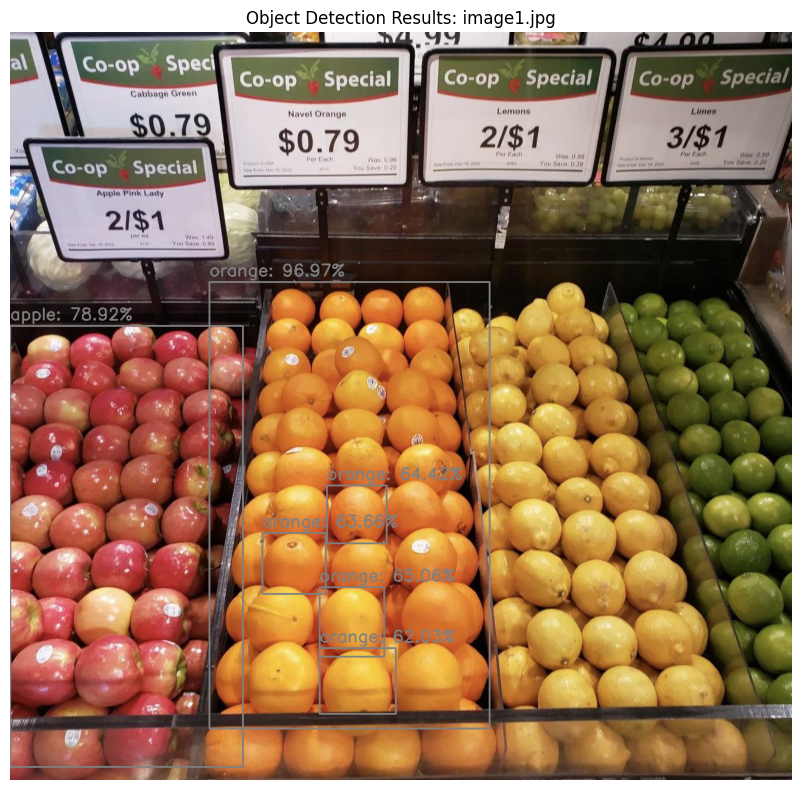

Processing Time: 5.8300 seconds
Number of Objects: 6
- orange (Confidence: 96.97%)
- apple (Confidence: 78.92%)
- orange (Confidence: 65.06%)
- orange (Confidence: 64.42%)
- orange (Confidence: 63.66%)
- orange (Confidence: 62.03%)
Annotated image saved to: detections/detected_image1.jpg

Processing image2.jpeg:


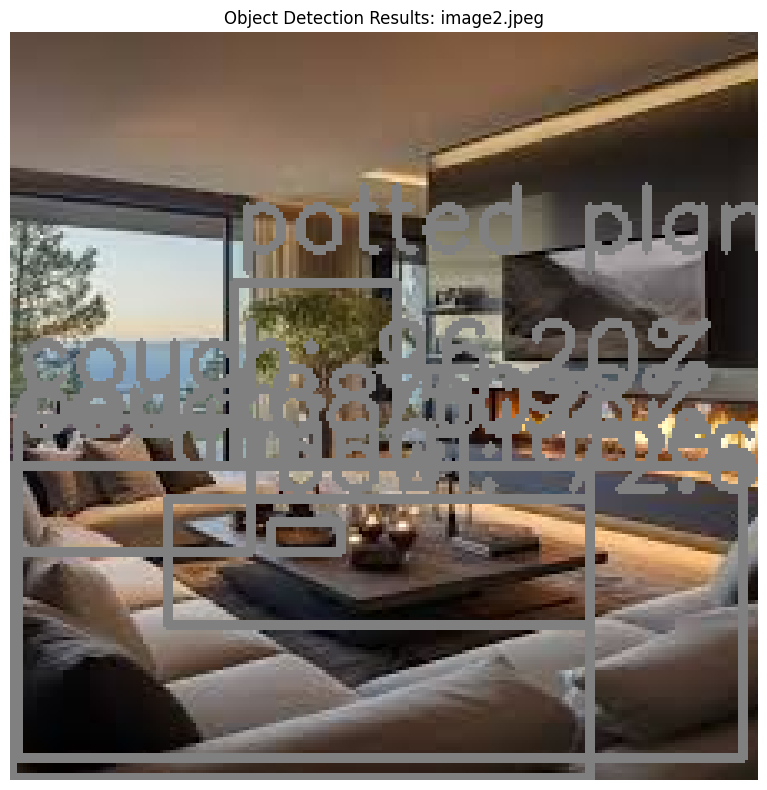

Processing Time: 6.2692 seconds
Number of Objects: 6
- potted plant (Confidence: 97.28%)
- couch (Confidence: 96.20%)
- couch (Confidence: 76.98%)
- bowl (Confidence: 72.68%)
- dining table (Confidence: 70.50%)
- bed (Confidence: 68.50%)
Annotated image saved to: detections/detected_image2.jpeg

Processing image3.webp:


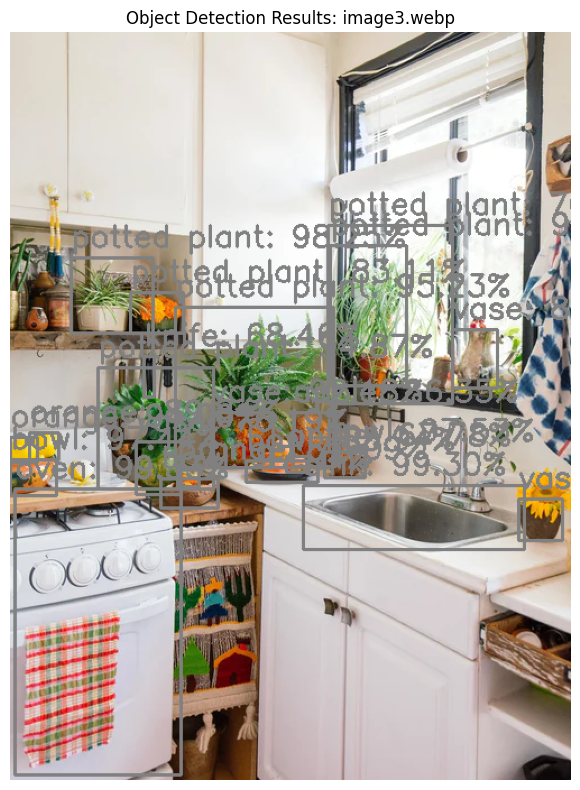

Processing Time: 7.0513 seconds
Number of Objects: 22
- oven (Confidence: 99.33%)
- sink (Confidence: 99.30%)
- potted plant (Confidence: 98.25%)
- bowl (Confidence: 97.94%)
- bowl (Confidence: 97.53%)
- bowl (Confidence: 97.44%)
- potted plant (Confidence: 95.23%)
- potted plant (Confidence: 95.16%)
- potted plant (Confidence: 94.87%)
- orange (Confidence: 94.09%)
- vase (Confidence: 92.18%)
- orange (Confidence: 89.84%)
- vase (Confidence: 89.24%)
- apple (Confidence: 86.35%)
- potted plant (Confidence: 83.11%)
- vase (Confidence: 81.53%)
- vase (Confidence: 76.19%)
- orange (Confidence: 73.09%)
- potted plant (Confidence: 70.18%)
- knife (Confidence: 68.46%)
- apple (Confidence: 67.78%)
- bowl (Confidence: 65.94%)
Annotated image saved to: detections/detected_image3.webp

Processing image4.jpg:


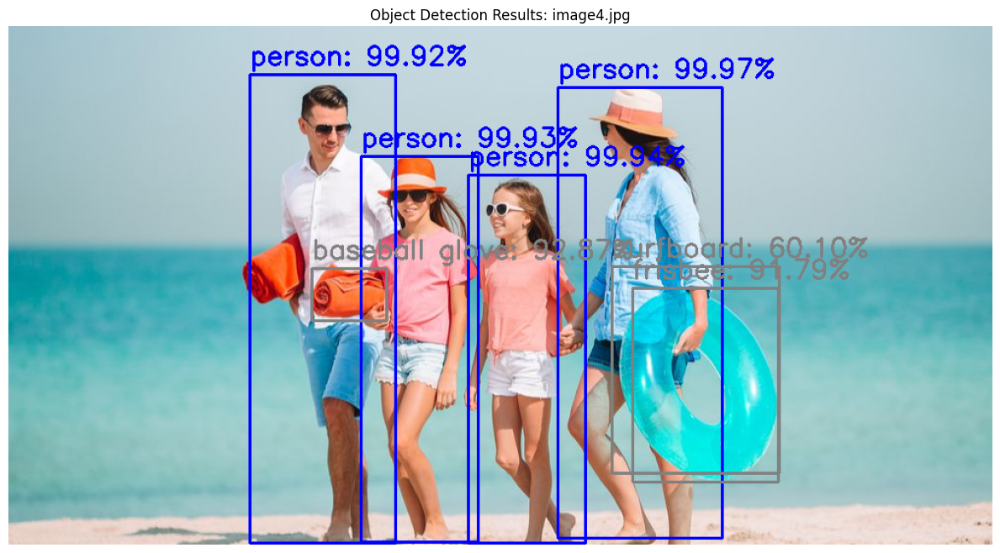

Processing Time: 8.1278 seconds
Number of Objects: 7
- person (Confidence: 99.97%)
- person (Confidence: 99.94%)
- person (Confidence: 99.93%)
- person (Confidence: 99.92%)
- baseball glove (Confidence: 92.87%)
- frisbee (Confidence: 91.79%)
- surfboard (Confidence: 60.10%)
Annotated image saved to: detections/detected_image4.jpg

Processing image5.jpg:


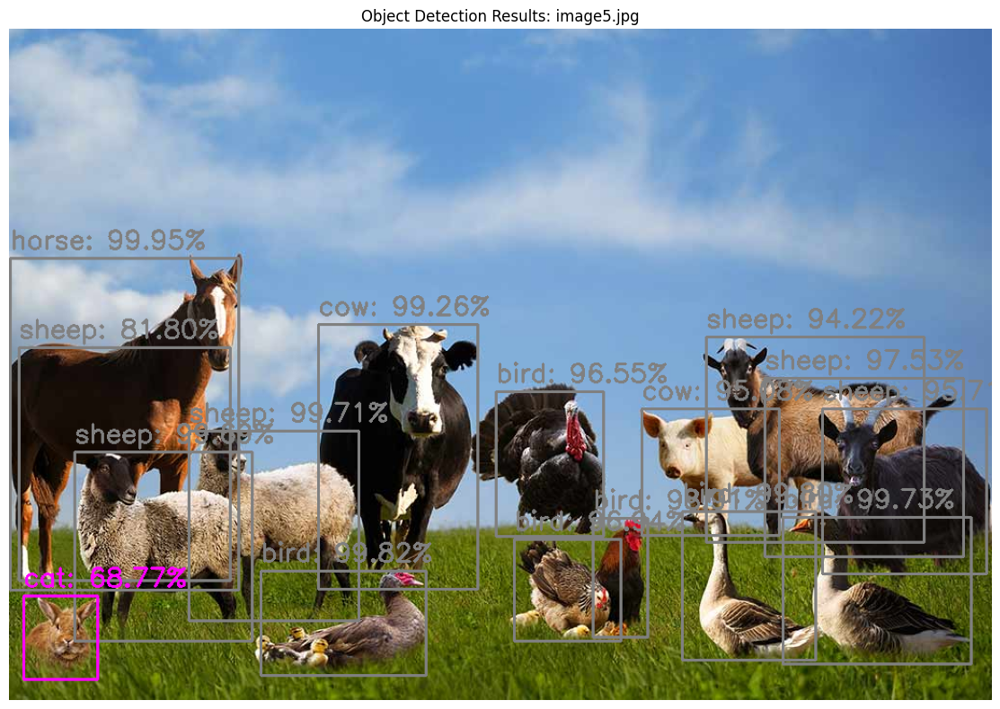

Processing Time: 8.7800 seconds
Number of Objects: 16
- horse (Confidence: 99.95%)
- bird (Confidence: 99.82%)
- bird (Confidence: 99.80%)
- bird (Confidence: 99.73%)
- sheep (Confidence: 99.71%)
- sheep (Confidence: 99.69%)
- cow (Confidence: 99.26%)
- bird (Confidence: 98.91%)
- sheep (Confidence: 97.53%)
- bird (Confidence: 96.94%)
- bird (Confidence: 96.55%)
- sheep (Confidence: 95.71%)
- cow (Confidence: 95.08%)
- sheep (Confidence: 94.22%)
- sheep (Confidence: 81.80%)
- cat (Confidence: 68.77%)
Annotated image saved to: detections/detected_image5.jpg


In [37]:
import os
import time
import torch
import torchvision
import numpy as np
import cv2w
import matplotlib.pyplot as plt
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision.utils import draw_bounding_boxes
from torchvision.transforms import functional as F
from collections import Counter

class FasterRCNNDetector:
    def __init__(self, confidence_threshold=0.5, device=None):
        """
        Initialize Faster R-CNN object detector

        Args:
            confidence_threshold (float): Minimum confidence for detection
            device (torch.device): Compute device (CPU/GPU)
        """
        # Set up device
        if device is None:
            self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        else:
            self.device = device

        # Load pre-trained Faster R-CNN model
        self.model = fasterrcnn_resnet50_fpn(pretrained=True)
        self.model.to(self.device)
        self.model.eval()

        # COCO dataset class names
        self.COCO_INSTANCE_CATEGORY_NAMES = [
            '__background__', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
            'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A', 'stop sign',
            'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow',
            'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack', 'umbrella', 'N/A', 'N/A',
            'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
            'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket',
            'bottle', 'N/A', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl',
            'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
            'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table',
            'N/A', 'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone',
            'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A', 'book',
            'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush'
        ]

        # Confidence threshold
        self.confidence_threshold = confidence_threshold

    def detect_objects(self, image_path):
        """
        Detect objects in a single image with processing time tracking

        Args:
            image_path (str): Path to input image

        Returns:
            tuple: (detections, processing_time, original_image)
        """
        # Start timing
        start_time = time.time()

        # Read image
        original_image = cv2.imread(image_path)
        image_rgb = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)

        # Convert to tensor
        input_image = F.to_tensor(image_rgb).unsqueeze(0).to(self.device)

        # Perform detection
        with torch.no_grad():
            prediction = self.model(input_image)

        # Process predictions
        detections = []
        for i in range(len(prediction[0]['scores'])):
            # Filter by confidence threshold
            if prediction[0]['scores'][i] >= self.confidence_threshold:
                # Get detection details
                bbox = prediction[0]['boxes'][i].cpu().numpy()
                class_id = prediction[0]['labels'][i].item()
                score = prediction[0]['scores'][i].item()
                class_name = self.COCO_INSTANCE_CATEGORY_NAMES[class_id]

                detections.append({
                    'class': class_name,
                    'confidence': score,
                    'bbox': bbox.tolist()
                })

        # Calculate processing time
        processing_time = time.time() - start_time

        return detections, processing_time, original_image

    def visualize_detections(self, image_path, output_directory='detections'):
        """
        Visualize object detections with bounding boxes and labels

        Args:
            image_path (str): Path to input image
            output_directory (str): Directory to save detection results

        Returns:
            dict: Detection results and visualization details
        """
        # Create output directory
        os.makedirs(output_directory, exist_ok=True)

        # Detect objects
        detections, processing_time, original_image = self.detect_objects(image_path)

        # Create a copy of the image for drawing
        annotated_image = original_image.copy()

        # Visualization parameters
        colors = {
            'person': (255, 0, 0),     # Red
            'car': (0, 255, 0),         # Green
            'bicycle': (0, 0, 255),     # Blue
            'dog': (255, 255, 0),       # Yellow
            'cat': (255, 0, 255),       # Magenta
            'default': (128, 128, 128)  # Gray
        }

        # Draw bounding boxes and labels
        for detection in detections:
            x1, y1, x2, y2 = map(int, detection['bbox'])
            class_name = detection['class']
            confidence = detection['confidence']

            # Choose color for bounding box
            color = colors.get(class_name, colors['default'])

            # Draw bounding box
            cv2.rectangle(annotated_image, (x1, y1), (x2, y2), color, 2)

            # Create label text
            label = f"{class_name}: {confidence:.2%}"

            # Put text above the bounding box
            cv2.putText(annotated_image, label, (x1, y1 - 10),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.9, color, 2)

        # Save annotated image
        filename = os.path.basename(image_path)
        output_path = os.path.join(output_directory, f'detected_{filename}')
        cv2.imwrite(output_path, annotated_image)

        # Visualize using matplotlib (additional visualization)
        plt.figure(figsize=(12, 8))
        plt.imshow(cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB))
        plt.title(f"Object Detection Results: {filename}")
        plt.axis('off')
        plt.tight_layout()
        plt.show()

        # Prepare and return results
        result = {
            'detections': detections,
            'processing_time': processing_time,
            'num_objects': len(detections),
            'image_path': image_path,
            'output_path': output_path
        }

        return result

def main():
    # Define batch of image paths
    image_paths = [
        'image1.jpg',
        'image2.jpeg',
        'image3.webp',
        'image4.jpg',
        'image5.jpg'
    ]

    # Initialize detector
    detector = FasterRCNNDetector(confidence_threshold=0.6)

    # Process and visualize each image
    for image_path in image_paths:
        print(f"\nProcessing {image_path}:")
        result = detector.visualize_detections(image_path)

        # Print detection details
        print(f"Processing Time: {result['processing_time']:.4f} seconds")
        print(f"Number of Objects: {result['num_objects']}")

        # Print object details
        for detection in result['detections']:
            print(f"- {detection['class']} (Confidence: {detection['confidence']:.2%})")

        print(f"Annotated image saved to: {result['output_path']}")

if __name__ == "__main__":
    main()

# *Summary Results of Methods*

In [20]:
import os
import time
import torch
import cv2
import pandas as pd
from ultralytics import YOLO
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision.transforms import functional as F

class ObjectDetector:
    def __init__(self):
        # Initialize YOLO model
        self.yolo_model = YOLO('yolov8n.pt')

        # Initialize Faster R-CNN model
        self.fasterrcnn_model = fasterrcnn_resnet50_fpn(pretrained=True)
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        self.fasterrcnn_model.to(self.device)
        self.fasterrcnn_model.eval()

        # COCO class labels
        self.COCO_INSTANCE_CATEGORY_NAMES = [
            '__background__', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
            'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A', 'stop sign',
            'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow',
            'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack', 'umbrella', 'N/A', 'N/A',
            'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
            'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket',
            'bottle', 'N/A', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl',
            'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
            'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table',
            'N/A', 'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone',
            'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A', 'book',
            'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush'
        ]

    def analyze_images(self, image_paths, confidence_threshold=0.5):
        summary_data = []

        for image_path in image_paths:
            # YOLO Analysis
            yolo_start = time.time()
            yolo_results = self.yolo_model(image_path)[0]
            yolo_detections = [
                {'class': self.yolo_model.names[int(result.cls[0])], 'confidence': float(result.conf[0])}
                for result in yolo_results.boxes
                if result.conf[0] >= confidence_threshold
            ]
            yolo_processing_time = time.time() - yolo_start

            # Faster R-CNN Analysis
            image_rgb = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
            input_image = F.to_tensor(image_rgb).unsqueeze(0).to(self.device)

            fasterrcnn_start = time.time()
            with torch.no_grad():
                prediction = self.fasterrcnn_model(input_image)

            fasterrcnn_detections = [
                {'class': self.COCO_INSTANCE_CATEGORY_NAMES[prediction[0]['labels'][i].item()],
                 'confidence': prediction[0]['scores'][i].item()}
                for i in range(len(prediction[0]['scores']))
                if prediction[0]['scores'][i] >= confidence_threshold
            ]
            fasterrcnn_processing_time = time.time() - fasterrcnn_start

            # YOLO Summary
            summary_data.append({
                'Image Name': os.path.basename(image_path),
                'Method': 'YOLOv8 Nano',
                'Objects Detected': len(yolo_detections),
                'Average Probability': f"{sum(det['confidence'] for det in yolo_detections)/len(yolo_detections):.2%}" if yolo_detections else "N/A",
                'Processing Time (s)': f"{yolo_processing_time:.4f}"
            })

            # Faster R-CNN Summary
            summary_data.append({
                'Image Name': os.path.basename(image_path),
                'Method': 'Faster R-CNN',
                'Objects Detected': len(fasterrcnn_detections),
                'Average Probability': f"{sum(det['confidence'] for det in fasterrcnn_detections)/len(fasterrcnn_detections):.2%}" if fasterrcnn_detections else "N/A",
                'Processing Time (s)': f"{fasterrcnn_processing_time:.4f}"
            })

        return pd.DataFrame(summary_data)

def main():
    image_paths = [
        'image1.jpg',
        'image2.jpeg',
        'image3.webp',
        'image4.jpg',
        'image5.jpg'
    ]

    detector = ObjectDetector()
    summary_df = detector.analyze_images(image_paths)
    print(summary_df.to_string(index=False))

if __name__ == "__main__":
    main()


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)



image 1/1 /content/image1.jpg: 640x640 2 apples, 1 orange, 235.3ms
Speed: 4.8ms preprocess, 235.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/image2.jpeg: 640x640 2 couchs, 1 potted plant, 1 tv, 230.3ms
Speed: 4.1ms preprocess, 230.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/image3.webp: 640x480 1 bottle, 3 bowls, 3 oranges, 4 potted plants, 1 oven, 1 sink, 3 vases, 179.4ms
Speed: 2.8ms preprocess, 179.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /content/image4.jpg: 352x640 4 persons, 1 frisbee, 149.8ms
Speed: 3.1ms preprocess, 149.8ms inference, 1.2ms postprocess per image at shape (1, 3, 352, 640)

image 1/1 /content/image5.jpg: 448x640 5 birds, 1 horse, 7 sheeps, 1 cow, 180.5ms
Speed: 3.6ms preprocess, 180.5ms inference, 1.7ms postprocess per image at shape (1, 3, 448, 640)
 Image Name       Method  Objects Detected Average Probability Processing Time (s)
 ima


# **Part ii : Extra**

**Color and Texture Analysis**

**Why add Color and Texture Analysis?**

1. Enhanced Object Understanding
   - Color and texture provide crucial supplementary information beyond simple bounding box detection
   - They help create a more nuanced understanding of objects, going beyond just classification
   - These features can improve object recognition, especially for similar-looking objects with distinct color or texture characteristics

2. Practical Applications
   - Industrial Quality Control: Detect manufacturing defects by analyzing surface texture and color variations
   - Medical Imaging: Identify potential anomalies in medical scans by examining tissue color and texture patterns
   - Agricultural Monitoring: Assess crop health, ripeness, and potential disease by analyzing plant color and leaf texture
   - Art and Design: Provide detailed visual characterization of objects for cataloging or restoration purposes

3. Machine Learning Enrichment
   - Additional feature extraction can improve machine learning model performance
   - Color and texture features can serve as additional input for more advanced classification or segmentation tasks
   - Provides richer feature vectors for potential transfer learning or fine-tuning scenarios

4. Forensic and Security Applications
   - Detailed object characterization can aid in object identification and tracking
   - Helps create more comprehensive object signatures beyond simple geometric boundaries
   - Useful in surveillance, evidence analysis, and pattern recognition

5. Research and Academic Purposes
   - Enables more sophisticated computer vision research
   - Provides granular data for studying visual perception and object recognition
   - Supports interdisciplinary research in fields like cognitive science and visual computing

6. Consumer and Retail Applications
   - Product recommendation systems
   - Virtual try-on technologies
   - Detailed product catalog generation
   - Color matching and style analysis

Example scenarios:
- In fashion, distinguishing between similar clothing items by their subtle color and texture differences
- In automotive industries, detecting paint quality or surface irregularities
- In agriculture, assessing fruit ripeness through color gradient analysis
- In medical diagnostics, identifying skin lesions or tissue abnormalities

By implementing color and texture analysis, we transform our object detection from a simple "detect and classify" model to a more sophisticated "understand and characterize" system that provides deeper insights into visual data.


*Answer help from ClaudeAI

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)



Processing image1.jpg:


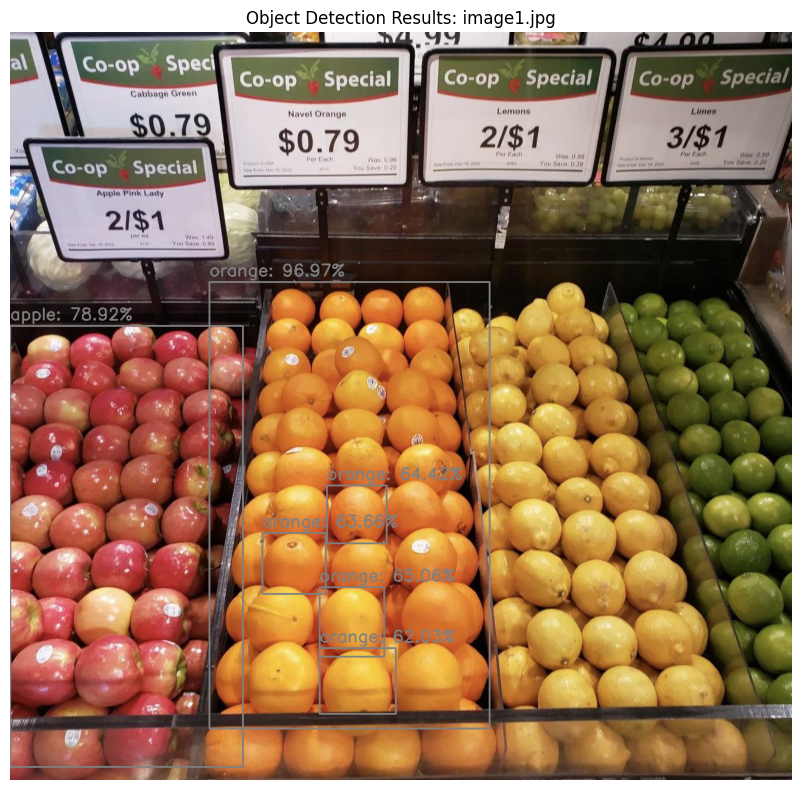

Processing Time: 8.2745 seconds
Number of Objects: 6

- orange (Confidence: 96.97%)
  Color Analysis:
    - Color RGB: [45, 104, 195], Percentage: 45.52%
    - Color RGB: [22, 30, 62], Percentage: 19.77%
    - Color RGB: [73, 169, 232], Percentage: 34.70%
    Mean Color: [50.72551456195504, 112.31014295035293, 182.12247167684916]
    Color Variation: [27.974141919010126, 54.44525118036682, 66.14452869191587]
  Texture Analysis:
    Texture Features:
      - Contrast: 98.8214
      - Dissimilarity: 4.4496
      - Homogeneity: 0.3757
      - Energy: 0.0268
      - Correlation: 0.9761
    Intensity Statistics:
      - Mean: 101.8713
      - Std: 45.5076
      - Min: 0.0000
      - Max: 254.0000

- apple (Confidence: 78.92%)
  Color Analysis:
    - Color RGB: [65, 78, 173], Percentage: 56.02%
    - Color RGB: [134, 157, 221], Percentage: 18.67%
    - Color RGB: [24, 30, 74], Percentage: 25.31%
    Mean Color: [67.90299311561714, 81.48422449451853, 157.45525874287696]
    Color Variation: [

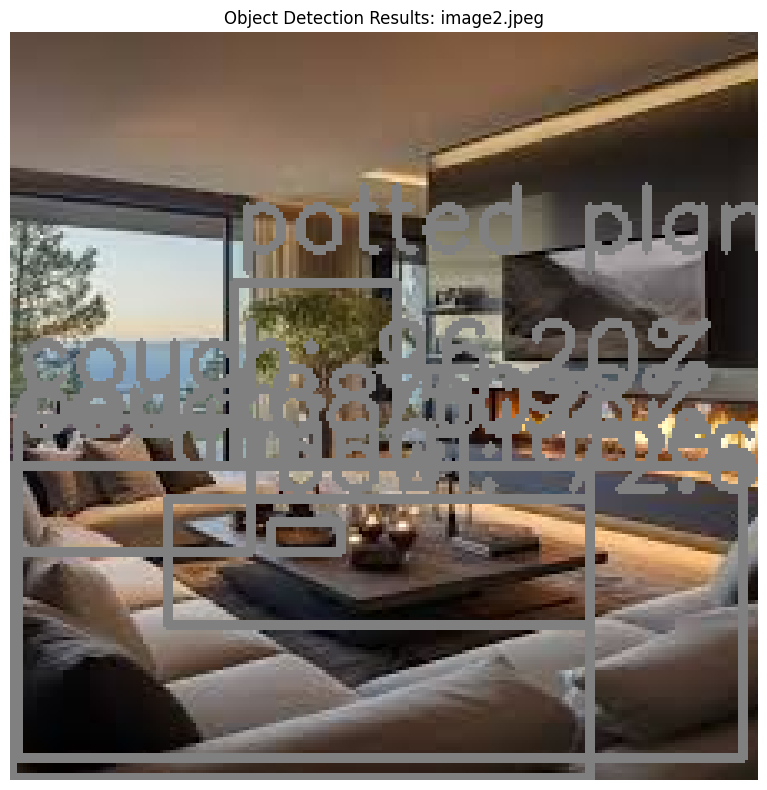

Processing Time: 5.8762 seconds
Number of Objects: 6

- potted plant (Confidence: 97.28%)
  Color Analysis:
    - Color RGB: [82, 108, 118], Percentage: 35.56%
    - Color RGB: [149, 165, 165], Percentage: 22.52%
    - Color RGB: [33, 57, 68], Percentage: 41.91%
    Mean Color: [76.78835978835978, 99.98450491307634, 108.12660619803476]
    Color Variation: [48.676681328646794, 45.848762048376386, 42.69861592087569]
  Texture Analysis:
    Texture Features:
      - Contrast: 814.3187
      - Dissimilarity: 19.7415
      - Homogeneity: 0.0680
      - Energy: 0.0171
      - Correlation: 0.8013
    Intensity Statistics:
      - Mean: 93.9720
      - Std: 45.7615
      - Min: 0.0000
      - Max: 217.0000

- couch (Confidence: 96.20%)
  Color Analysis:
    - Color RGB: [139, 154, 172], Percentage: 33.64%
    - Color RGB: [30, 37, 51], Percentage: 29.86%
    - Color RGB: [73, 86, 105], Percentage: 36.50%
    Mean Color: [82.95785714285714, 95.04285714285714, 112.03428571428572]
    Color Vari

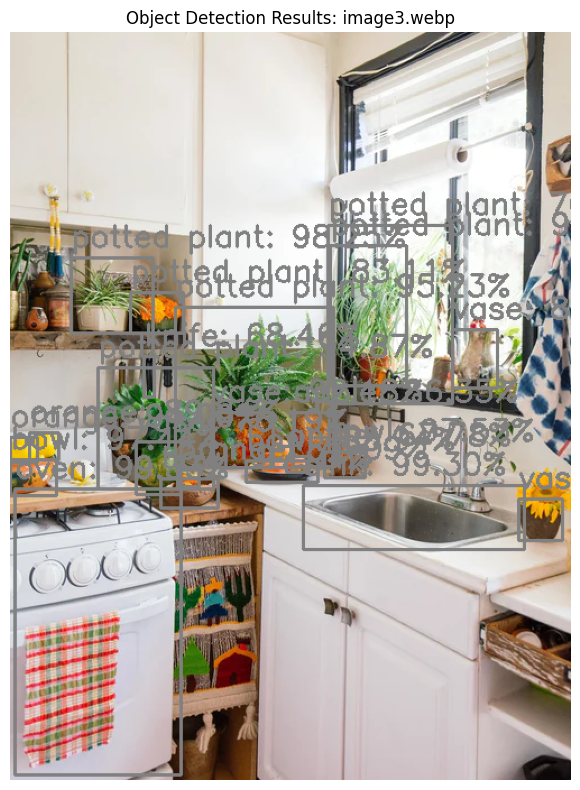

Processing Time: 8.9800 seconds
Number of Objects: 22

- oven (Confidence: 99.33%)
  Color Analysis:
    - Color RGB: [52, 66, 108], Percentage: 12.31%
    - Color RGB: [215, 210, 214], Percentage: 60.62%
    - Color RGB: [134, 148, 192], Percentage: 27.08%
    Mean Color: [173.44014308426074, 176.00105988341284, 195.73704292527822]
    Color Variation: [61.512105344834765, 53.761261981233496, 44.607294423579525]
  Texture Analysis:
    Texture Features:
      - Contrast: 309.0717
      - Dissimilarity: 8.4767
      - Homogeneity: 0.3811
      - Energy: 0.0451
      - Correlation: 0.9448
    Intensity Statistics:
      - Mean: 177.4494
      - Std: 53.1675
      - Min: 2.0000
      - Max: 255.0000

- sink (Confidence: 99.30%)
  Color Analysis:
    - Color RGB: [212, 216, 219], Percentage: 37.78%
    - Color RGB: [84, 92, 96], Percentage: 35.24%
    - Color RGB: [146, 160, 172], Percentage: 26.98%
    Mean Color: [149.65722682340368, 157.5671920919049, 163.7551874610384]
    Color Varia

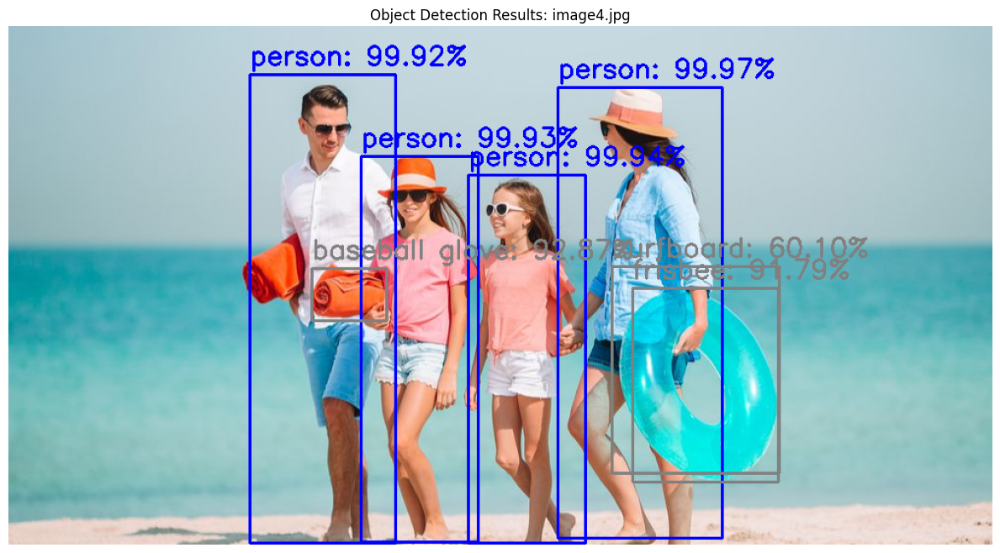

Processing Time: 10.0964 seconds
Number of Objects: 7

- person (Confidence: 99.97%)
  Color Analysis:
    - Color RGB: [85, 98, 136], Percentage: 14.37%
    - Color RGB: [208, 205, 187], Percentage: 62.46%
    - Color RGB: [209, 191, 30], Percentage: 23.18%
    Mean Color: [191.0975080406872, 186.9509844938943, 143.7996888319431]
    Color Variation: [51.31309446409598, 45.03016523620496, 75.7516047683765]
  Texture Analysis:
    Texture Features:
      - Contrast: 185.9235
      - Dissimilarity: 6.1837
      - Homogeneity: 0.4026
      - Energy: 0.0551
      - Correlation: 0.9504
    Intensity Statistics:
      - Mean: 183.3205
      - Std: 43.2552
      - Min: 6.0000
      - Max: 254.0000

- person (Confidence: 99.94%)
  Color Analysis:
    - Color RGB: [79, 97, 159], Percentage: 29.32%
    - Color RGB: [201, 198, 162], Percentage: 40.28%
    - Color RGB: [179, 189, 240], Percentage: 30.39%
    Mean Color: [159.0970880330742, 166.30166719094055, 185.31481148609177]
    Color Variati

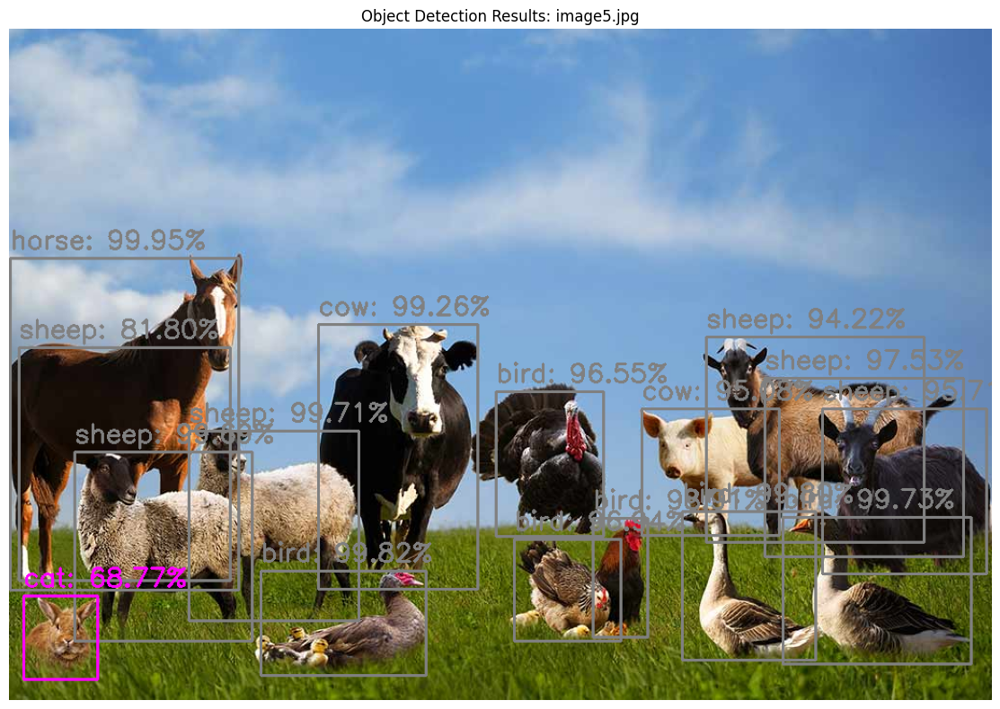

Processing Time: 10.0428 seconds
Number of Objects: 16

- horse (Confidence: 99.95%)
  Color Analysis:
    - Color RGB: [196, 190, 183], Percentage: 36.10%
    - Color RGB: [12, 20, 32], Percentage: 41.41%
    - Color RGB: [58, 100, 131], Percentage: 22.49%
    Mean Color: [89.30894496526935, 99.76058920678098, 109.03958808957108]
    Color Variation: [85.98231494134464, 77.09030864694068, 73.6379591173018]
  Texture Analysis:
    Texture Features:
      - Contrast: 521.7323
      - Dissimilarity: 11.2484
      - Homogeneity: 0.3745
      - Energy: 0.0608
      - Correlation: 0.9571
    Intensity Statistics:
      - Mean: 97.7088
      - Std: 77.9308
      - Min: 0.0000
      - Max: 255.0000

- bird (Confidence: 99.82%)
  Color Analysis:
    - Color RGB: [41, 102, 105], Percentage: 41.61%
    - Color RGB: [11, 62, 61], Percentage: 44.90%
    - Color RGB: [133, 156, 183], Percentage: 13.49%
    Mean Color: [40.343983358224875, 91.47994452741625, 95.95284830381907]
    Color Variation: [

In [43]:
import os
import time
import torch
import torchvision
import numpy as np
import cv2
import matplotlib.pyplot as plt
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision.utils import draw_bounding_boxes
from torchvision.transforms import functional as F
from collections import Counter
from skimage.feature import graycomatrix, graycoprops
from scipy.stats import mode

class FasterRCNNDetector:
    def __init__(self, confidence_threshold=0.5, device=None):
        """
        Initialize Faster R-CNN object detector

        Args:
            confidence_threshold (float): Minimum confidence for detection
            device (torch.device): Compute device (CPU/GPU)
        """
        # Set up device
        if device is None:
            self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        else:
            self.device = device

        # Load pre-trained Faster R-CNN model
        self.model = fasterrcnn_resnet50_fpn(pretrained=True)
        self.model.to(self.device)
        self.model.eval()

        # COCO dataset class names
        self.COCO_INSTANCE_CATEGORY_NAMES = [
            '__background__', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
            'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A', 'stop sign',
            'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow',
            'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack', 'umbrella', 'N/A', 'N/A',
            'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
            'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket',
            'bottle', 'N/A', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl',
            'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
            'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table',
            'N/A', 'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone',
            'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A', 'book',
            'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush'
        ]

        # Confidence threshold
        self.confidence_threshold = confidence_threshold

    def detect_objects(self, image_path):
        """
        Detect objects in a single image with processing time tracking

        Args:
            image_path (str): Path to input image

        Returns:
            tuple: (detections, processing_time, original_image)
        """
        # Start timing
        start_time = time.time()

        # Read image
        original_image = cv2.imread(image_path)
        image_rgb = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)

        # Convert to tensor
        input_image = F.to_tensor(image_rgb).unsqueeze(0).to(self.device)

        # Perform detection
        with torch.no_grad():
            prediction = self.model(input_image)

        # Process predictions
        detections = []
        for i in range(len(prediction[0]['scores'])):
            # Filter by confidence threshold
            if prediction[0]['scores'][i] >= self.confidence_threshold:
                # Get detection details
                bbox = prediction[0]['boxes'][i].cpu().numpy()
                class_id = prediction[0]['labels'][i].item()
                score = prediction[0]['scores'][i].item()
                class_name = self.COCO_INSTANCE_CATEGORY_NAMES[class_id]

                detections.append({
                    'class': class_name,
                    'confidence': score,
                    'bbox': bbox.tolist()
                })

        # Calculate processing time
        processing_time = time.time() - start_time

        return detections, processing_time, original_image

    def analyze_object_color(self, image, bbox):
        """
        Analyze color characteristics of a detected object

        Args:
            image (numpy.ndarray): Original image
            bbox (list): Bounding box coordinates [x1, y1, x2, y2]

        Returns:
            dict: Color analysis results
        """
        # Extract object region
        x1, y1, x2, y2 = map(int, bbox)
        object_region = image[y1:y2, x1:x2]

        # Convert to RGB if needed
        if len(object_region.shape) == 0 or object_region.size == 0:
            return None

        if len(object_region.shape) == 2 or object_region.shape[2] == 1:
            object_region = cv2.cvtColor(object_region, cv2.COLOR_GRAY2RGB)

        # Reshape for color analysis
        pixels = object_region.reshape(-1, 3)

        # Calculate dominant colors using k-means clustering
        criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)
        flags = cv2.KMEANS_RANDOM_CENTERS
        k = 3  # Number of dominant colors

        try:
            _, labels, centers = cv2.kmeans(pixels.astype(np.float32), k, None, criteria, 10, flags)
        except cv2.error:
            return None

        # Convert centers back to uint8
        centers = np.uint8(centers)

        # Calculate percentage of each color cluster
        unique, counts = np.unique(labels, return_counts=True)
        color_percentages = dict(zip(unique, counts / len(labels) * 100))

        # Map color clusters to RGB values
        dominant_colors = [
            {
                'rgb': centers[i].tolist(),
                'percentage': color_percentages[i]
            } for i in unique
        ]

        # Color variation analysis
        color_std = np.std(pixels, axis=0)
        color_mean = np.mean(pixels, axis=0)

        return {
            'dominant_colors': dominant_colors,
            'color_variation': {
                'mean_color': color_mean.tolist(),
                'color_standard_deviation': color_std.tolist()
            }
        }

    def analyze_object_texture(self, image, bbox):
        """
        Analyze texture characteristics of a detected object

        Args:
            image (numpy.ndarray): Original image
            bbox (list): Bounding box coordinates [x1, y1, x2, y2]

        Returns:
            dict: Texture analysis results
        """
        # Extract object region
        x1, y1, x2, y2 = map(int, bbox)
        object_region = image[y1:y2, x1:x2]

        # Convert to grayscale
        if len(object_region.shape) == 3:
            object_region = cv2.cvtColor(object_region, cv2.COLOR_RGB2GRAY)

        # Resize if too small for texture analysis
        min_size = 32
        if object_region.shape[0] < min_size or object_region.shape[1] < min_size:
            object_region = cv2.resize(object_region, (min_size, min_size))

        # Compute gray-level co-occurrence matrix (GLCM)
        glcm = graycomatrix(object_region,
                            distances=[1],
                            angles=[0, np.pi/4, np.pi/2, 3*np.pi/4],
                            levels=256,
                            symmetric=True,
                            normed=True)

        # Compute texture features
        texture_features = {
            'contrast': graycoprops(glcm, 'contrast')[0, 0],
            'dissimilarity': graycoprops(glcm, 'dissimilarity')[0, 0],
            'homogeneity': graycoprops(glcm, 'homogeneity')[0, 0],
            'energy': graycoprops(glcm, 'energy')[0, 0],
            'correlation': graycoprops(glcm, 'correlation')[0, 0]
        }

        # Pixel intensity statistics
        intensity_stats = {
            'mean': np.mean(object_region),
            'std': np.std(object_region),
            'min': np.min(object_region),
            'max': np.max(object_region)
        }

        return {
            'texture_features': texture_features,
            'intensity_stats': intensity_stats
        }

    def visualize_detections(self, image_path, output_directory='detections'):
        """
        Visualize object detections with bounding boxes, labels, and additional analysis

        Args:
            image_path (str): Path to input image
            output_directory (str): Directory to save detection results

        Returns:
            dict: Detection results and visualization details
        """
        # Create output directory
        os.makedirs(output_directory, exist_ok=True)

        # Detect objects
        detections, processing_time, original_image = self.detect_objects(image_path)

        # Create a copy of the image for drawing
        annotated_image = original_image.copy()

        # Visualization parameters
        colors = {
            'person': (255, 0, 0),     # Red
            'car': (0, 255, 0),         # Green
            'bicycle': (0, 0, 255),     # Blue
            'dog': (255, 255, 0),       # Yellow
            'cat': (255, 0, 255),       # Magenta
            'default': (128, 128, 128)  # Gray
        }

        # Extend detections with color and texture analysis
        for detection in detections:
            x1, y1, x2, y2 = map(int, detection['bbox'])
            class_name = detection['class']
            confidence = detection['confidence']

            # Choose color for bounding box
            color = colors.get(class_name, colors['default'])

            # Draw bounding box
            cv2.rectangle(annotated_image, (x1, y1), (x2, y2), color, 2)

            # Create label text
            label = f"{class_name}: {confidence:.2%}"

            # Put text above the bounding box
            cv2.putText(annotated_image, label, (x1, y1 - 10),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.9, color, 2)

            # Perform color and texture analysis
            color_analysis = self.analyze_object_color(original_image, detection['bbox'])
            texture_analysis = self.analyze_object_texture(original_image, detection['bbox'])

            # Add analysis results to detection
            detection['color_analysis'] = color_analysis
            detection['texture_analysis'] = texture_analysis

        # Save annotated image
        filename = os.path.basename(image_path)
        output_path = os.path.join(output_directory, f'detected_{filename}')
        cv2.imwrite(output_path, annotated_image)

        # Visualize using matplotlib (additional visualization)
        plt.figure(figsize=(12, 8))
        plt.imshow(cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB))
        plt.title(f"Object Detection Results: {filename}")
        plt.axis('off')
        plt.tight_layout()
        plt.show()

        # Prepare and return results
        result = {
            'detections': detections,
            'processing_time': processing_time,
            'num_objects': len(detections),
            'image_path': image_path,
            'output_path': output_path
        }

        return result

def main():
    # Define batch of image paths
    image_paths = [
        'image1.jpg',
        'image2.jpeg',
        'image3.webp',
        'image4.jpg',
        'image5.jpg'
    ]

    # Initialize detector
    detector = FasterRCNNDetector(confidence_threshold=0.6)

    # Process and visualize each image
    for image_path in image_paths:
        print(f"\nProcessing {image_path}:")
        result = detector.visualize_detections(image_path)

        # Print detection details
        print(f"Processing Time: {result['processing_time']:.4f} seconds")
        print(f"Number of Objects: {result['num_objects']}")

        # Print object details with color and texture analysis
        for detection in result['detections']:
            print(f"\n- {detection['class']} (Confidence: {detection['confidence']:.2%})")

            # Color analysis output
            if detection['color_analysis']:
                print("  Color Analysis:")
                for color in detection['color_analysis']['dominant_colors']:
                    print(f"    - Color RGB: {color['rgb']}, Percentage: {color['percentage']:.2f}%")

                mean_color = detection['color_analysis']['color_variation']['mean_color']
                color_std = detection['color_analysis']['color_variation']['color_standard_deviation']
                print(f"    Mean Color: {mean_color}")
                print(f"    Color Variation: {color_std}")

            # Texture analysis output
            if detection['texture_analysis']:
                print("  Texture Analysis:")
                texture_features = detection['texture_analysis']['texture_features']
                intensity_stats = detection['texture_analysis']['intensity_stats']

                print("    Texture Features:")
                for feature, value in texture_features.items():
                    print(f"      - {feature.capitalize()}: {value:.4f}")

                print("    Intensity Statistics:")
                for stat, value in intensity_stats.items():
                    print(f"      - {stat.capitalize()}: {value:.4f}")

        print(f"\nAnnotated image saved to: {result['output_path']}")

if __name__ == "__main__":
    main()